In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
import statsmodels.api as sm
import pandas.tseries
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import itertools
from matplotlib.pylab import rcParams


df = pd.read_csv('zillow_data.csv')

In [2]:
def get_datetimes(df):
    return pd.to_datetime(df.columns.values[7:], format='%Y-%m')

In [3]:
def get_datetimes(df):
    return pd.to_datetime(df.columns.values[7:], format='%Y-%m')

In [4]:
def melt_data(df):
    melted = pd.melt(df, id_vars=['RegionID','RegionName', 'City', 'State', 'Metro', 'CountyName','SizeRank'], var_name='time')
    melted['time'] = pd.to_datetime(melted['time'], infer_datetime_format=True)
    melted = melted.dropna(subset=['value'])
    return melted.groupby('time').aggregate({'value':['mean','std']})

In [144]:
pd.options.display.max_columns = 10

In [14]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14723 entries, 0 to 14722
Data columns (total 272 columns):
 #   Column      Dtype  
---  ------      -----  
 0   RegionID    int64  
 1   RegionName  int64  
 2   City        object 
 3   State       object 
 4   Metro       object 
 5   CountyName  object 
 6   SizeRank    int64  
 7   1996-04     float64
 8   1996-05     float64
 9   1996-06     float64
 10  1996-07     float64
 11  1996-08     float64
 12  1996-09     float64
 13  1996-10     float64
 14  1996-11     float64
 15  1996-12     float64
 16  1997-01     float64
 17  1997-02     float64
 18  1997-03     float64
 19  1997-04     float64
 20  1997-05     float64
 21  1997-06     float64
 22  1997-07     float64
 23  1997-08     float64
 24  1997-09     float64
 25  1997-10     float64
 26  1997-11     float64
 27  1997-12     float64
 28  1998-01     float64
 29  1998-02     float64
 30  1998-03     float64
 31  1998-04     float64
 32  1998-05     float64
 33  1998-06   

In [19]:
#Although there are missing values will evaluate when bringing into smaller groups because can backfill theree
df.isna().sum()

RegionID         0
RegionName       0
City             0
State            0
Metro         1043
CountyName       0
SizeRank         0
1996-04       1039
1996-05       1039
1996-06       1039
1996-07       1039
1996-08       1039
1996-09       1039
1996-10       1039
1996-11       1039
1996-12       1039
1997-01       1039
1997-02       1039
1997-03       1039
1997-04       1039
1997-05       1039
1997-06       1039
1997-07       1038
1997-08       1038
1997-09       1038
1997-10       1038
1997-11       1038
1997-12       1038
1998-01       1036
1998-02       1036
1998-03       1036
1998-04       1036
1998-05       1036
1998-06       1036
1998-07       1036
1998-08       1036
1998-09       1036
1998-10       1036
1998-11       1036
1998-12       1036
1999-01       1036
1999-02       1036
1999-03       1036
1999-04       1036
1999-05       1036
1999-06       1036
1999-07       1036
1999-08       1036
1999-09       1036
1999-10       1036
1999-11       1036
1999-12       1036
2000-01     

In [21]:
#columns not in date time so need to find way to graph those and convert to date time
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,1997-01,1997-02,1997-03,1997-04,1997-05,1997-06,1997-07,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,1998-06,1998-07,1998-08,1998-09,1998-10,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,337600.0,338500.0,339500.0,340400.0,341300.0,342600.0,344400.0,345700.0,346700.0,347800.0,349000.0,350400.0,352000.0,353900.0,356200.0,358800.0,361800.0,365700.0,370200.0,374700.0,378900.0,383500.0,388300.0,393300.0,398500.0,403800.0,409100.0,414600.0,420100.0,426200.0,432600.0,438600.0,444200.0,450000.0,455900.0,462100.0,468500.0,475300.0,482500.0,490200.0,498200.0,507200.0,516800.0,526300.0,535300.0,544500.0,553500.0,562400.0,571200.0,579800.0,588100.0,596300.0,604200.0,612200.0,620200.0,627700.0,634500.0,641000.0,647000.0,652700.0,658100.0,663300.0,668400.0,673400.0,678300.0,683200.0,688300.0,693300.0,698000.0,702400.0,706400.0,710200.0,714000.0,717800.0,721700.0,725700.0,729900.0,733400.0,735600.0,737200.0,739000.0,740900.0,742700.0,744400.0,746000.0,747200.0,748000.0,749000.0,750200.0,752300.0,755300.0,759200.0,764000.0,769600.0,775600.0,781900.0,787900.0,793200.0,798200.0,803100.0,807900.0,812900.0,818100.0,823100.0,828300.0,834100.0,839800.0,845600.0,851800.0,858000.0,864400.0,870700.0,876200.0,880700.0,884400.0,887600.0,890500.0,893300.0,895500.0,897300.0,899000.0,900400.0,902000.0,904400.0,907100.0,909700.0,911900.0,913000.0,913000.0,912000.0,909300.0,905300.0,901400.0,897900.0,895400.0,893600.0,891100.0,887000.0,881700.0,875900.0,870300.0,865100.0,859000.0,851500.0,843800.0,836400.0,830700.0,827300.0,824800.0,821600.0,818300.0,814600.0,809800.0,803600.0,795500.0,786900.0,780700.0,776900.0,774700.0,774200.0,774400.0,774600.0,775600.0,777800.0,775200.0,767900.0,764700.0,766100.0,764100.0,759700.0,754900.0,746200.0,737300.0,730800.0,729300.0,730200.0,730700.0,730000.0,730100.0,730100.0,731200.0,733900.0,735500.0,735400.0,734400.0,737500.0,737700.0,733700.0,734000.0,740300.0,744600.0,750500.0,760400.0,771800.0,780600.0,

In [22]:
#Firstly grouping into states to see which states to pull counties for
states = df.drop(columns=['RegionID','RegionName', 'City', 'Metro', 'CountyName','SizeRank'],axis=1).groupby('State').mean()
states = pd.DataFrame(states.reset_index())
state_columns = list(states.T.iloc[0])
states = states.T
states.columns = state_columns
states = states[1:]
states = states.set_index(pd.to_datetime(states.index))
states = states.applymap(lambda x: round(np.float(x),2))

In [23]:
states

,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,GA,HI,IA,ID,IL,IN,KS,KY,LA,MA,MD,ME,MI,MN,MO,MS,MT,NC,ND,NE,NH,NJ,NM,NV,NY,OH,OK,OR,PA,RI,SC,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
1996-04-01,128382.14,86795.57,68868.04,116202.79,200220.96,142561.94,157189.52,189216.67,125784.62,104529.02,95783.16,211811.76,78396.62,91951.58,127624.67,87843.11,77842.26,82155.00,65484.83,159684.54,146417.89,98218.18,92834.00,90961.92,91146.47,86397.01,157838.46,91146.02,NaN,89468.57,107132.82,175215.94,137096.23,153680.68,129927.51,88665.97,53432.38,124325.71,89103.01,125286.44,82504.69,54320.00,66087.47,109384.64,159645.69,122071.24,82825.00,140589.29,115151.38,66461.67,138712.50
1996-05-01,128832.14,87122.15,69015.46,116562.79,200124.83,142765.99,157063.71,188611.11,126234.62,104594.12,96158.42,212880.39,78620.95,92221.05,127884.70,87546.68,78180.36,82376.67,65710.34,160031.64,146256.87,98068.83,93448.12,91142.73,91395.91,86532.84,157840.38,91397.51,NaN,90275.71,107122.05,175114.14,137143.40,153744.32,129850.56,88883.74,53730.00,124852.38,89175.78,125166.10,82895.31,54640.00,66340.85,109406.89,159523.28,122136.83,82556.25,140838.99,115099.39,66575.00,138762.50
1996-06-01,129253.57,87460.76,69140.21,116934.88,200035.94,142985.43,156926.61,188011.11,126665.38,104662.35,96538.14,213807.84,78825.00,92520.00,128043.02,87263.78,78545.24,82612.50,65939.31,160384.78,146067.41,97916.88,94071.96,91332.27,91664.68,86670.15,157871.15,91621.89,NaN,91025.71,107128.72,174992.83,137190.57,153789.77,129776.14,89120.04,53997.62,125366.19,89243.79,125044.07,83322.40,54960.00,66594.99,109451.38,159406.90,122201.08,82306.25,141101.49,115032.11,66708.33,138741.67
1996-07-01,129639.29,87798.73,69262.89,117315.35,199965.57,143204.45,156778.23,187438.89,127026.92,104727.06,96922.34,214572.55,79007.43,92852.63,128086.62,87004.08,78938.10,82856.67,66181.38,160743.00,145856.55,97758.44,94698.01,91510.47,91946.84,86792.54,157928.85,91837.81,NaN,91718.57,107130.26,174856.37,137258.49,153838.64,129694.21,89377.13,54233.33,125877.14,89302.26,124898.31,83784.38,55290.00,66843.11,109521.50,159313.79,122267.20,82037.50,141378.57,114940.67,66848.33,138641.67
1996-08-01,130028.57,88156.96,69378.35,117719.53,199958.75,143461.94,156640.32,186900.00,127346.15,104816.99,97306.87,215203.92,79156.76,93222.11,128025.62,86788.52,79339.88,83115.83,66425.52,161103.14,145661.34,97610.39,95312.14,91693.31,92252.04,86914.93,157982.69,92063.93,NaN,92320.00,107148.72,174732.87,137349.06,153918.18,129623.35,89642.53,54443.33,126403.81,89368.88,124779.66,84286.46,55660.00,67081.70,109613.98,159254.31,122352.42,81781.25,141686.01,114840.98,67016.67,138533.33
1996-09-01,130367.86,88531.01,69507.22,118150.23,200037.63,143752.63,156525.81,186494.44,127603.85,104938.56,97694.85,215684.31,79316.89,93648.42,127866.92,86615.82,79775.00,83395.00,66676.55,161485.51,145495.21,97472.73,95919.43,91872.97,92590.33,87017.91,158026.92,92320.90,NaN,92834.29,107187.18,174644.82,137460.38,154048.86,129568.53,89919.28,54646.19,126945.71,89450.19,124681.36,84835.94,56020.00,67325.56,109721.50,159244.83,122473.92,81568.75,142026.49,114756.88,67196.67,138412.50
1996-10-01,130710.71,88918.99,69674.23,118626.51,200277.02,144106.88,156462.90,186222.22,127838.46,105112.03,98112.03,216072.55,79475.00,94162.11,127633.46,86497.19,80272.62,83698.33,66944.14,161928.02,145397.44,97377.92,96540.40,92074.13,92971.00,87094.03,158057.69,92642.04,NaN,93271.43,107268.72,174634.26,137639.62,154277.27,129556.65,90217.20,54855.24,127532.38,89562.11,124635.59,85460.42,56390.00,67585.46,109843.54,159320.69,122653.49,81418.75,142434.52,114704.89,67401.67,138304.17
1996-11-01,131085.71,89327.85,69885.57,119141.40,200643.01,144507.29,156439.52,186116.67,128046.15,105324.18,98533.68,216305.88,79639.86,94762.11,127322.18,86427.81,80832.14,84018.33,67222.76,162402.42,145340.26,97288.31,97164.24,92285.47,93385.87,87150.75,158075.00,93003.98,NaN,93595.71,107377.95,174673.31,137862.26,154557.95,129591.17,90520.23,55058.57,128156.67,89695.86,124577.97,86130.21,56660.00,67844

In [37]:
states.index = pd.to_datetime(states.index,format='%Y-%M')
states.index

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', length=265, freq=None)

In [68]:
top10states = list(states.iloc[-1,:].sort_values(ascending=False).head(10).index)
states.iloc[-1,:]

AK    323046.43
AL    157033.88
AR    137620.00
AZ    271952.17
CA    746329.08
CO    410528.92
CT    285431.45
DC    806166.67
DE    271897.56
FL    288191.59
GA    202164.35
HI    683529.03
IA    170143.67
ID    236100.00
IL    211926.51
IN    131251.87
KS    141133.20
KY    155538.85
LA    147392.23
MA    458622.54
MD    329705.36
ME    257631.40
MI    167361.52
MN    227567.73
MO    162589.34
MS    115360.78
MT    238673.24
NC    193125.70
ND    190441.94
NE    176512.05
NH    268830.15
NJ    399037.85
NM    222230.00
NV    329420.39
NY    384160.69
OH    145373.30
OK    117952.04
OR    324085.27
PA    184787.61
RI    308430.51
SC    192832.04
SD    194715.79
TN    151884.16
TX    198029.73
UT    317001.65
VA    285568.83
VT    213150.00
WA    408570.38
WI    199015.36
WV    125476.39
WY    231338.71
Name: 2018-04-01 00:00:00, dtype: float64

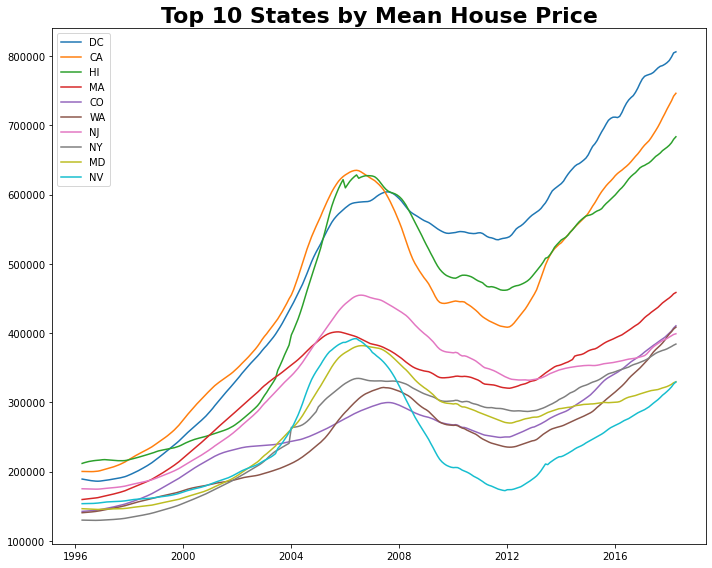

In [36]:
top10states = list(states.iloc[-1,:].sort_values(ascending=False).head(10).index)
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
rcParams['figure.figsize'] = 10,8
sns.lineplot(data=states[top10states],dashes=False)
plt.title('Top 10 States by Mean House Price',font=font)
plt.tight_layout()

Can see that solely on home price basis DC, CA, HI and MA are top states, but this does not consider std or risk free rate

In [28]:
#importing data on US 10 year treasury rates i.e. risk free rate
rfr = pd.read_csv('DGS10.csv')

In [29]:
rfr.DATE = pd.to_datetime(rfr.DATE,infer_datetime_format=True)
rfr = rfr.set_index('DATE')
rfr.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5848 entries, 1996-01-02 to 2018-05-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   DGS10   5848 non-null   object
dtypes: object(1)
memory usage: 91.4+ KB


In [30]:
#cleaing this for string issues and converting to float, also resampling from daily to monthly ts
#and trimming to fit our dataset
rfr = rfr[rfr.DGS10 != '.']
rfr.DGS10 = rfr.DGS10.apply(lambda x: np.float(x))
rfr = rfr.resample('MS',).mean()
rfr = rfr[3:-1]
rfr.DGS10 = rfr.DGS10/100

In [31]:
rfr

,DGS10
DATE,
1996-04-01,0.065114
1996-05-01,0.067368
1996-06-01,0.069120
1996-07-01,0.068655
1996-08-01,0.066355
1996-09-01,0.068320
1996-10-01,0.065336
1996-11-01,0.062037
1996-12-01,0.063024


In [42]:
state_list = list(states.columns)

In [43]:
state_dfs = []
for x in state_list:
    x = pd.DataFrame(data = states[x],)
    state_dfs.append(x)

In [44]:
state_dfs

[                   AK
 1996-04-01  128382.14
 1996-05-01  128832.14
 1996-06-01  129253.57
 1996-07-01  129639.29
 1996-08-01  130028.57
 1996-09-01  130367.86
 1996-10-01  130710.71
 1996-11-01  131085.71
 1996-12-01  131557.14
 1997-01-01  132107.14
 1997-02-01  132546.43
 1997-03-01  132907.14
 1997-04-01  133275.00
 1997-05-01  133653.57
 1997-06-01  134060.71
 1997-07-01  134489.29
 1997-08-01  134932.14
 1997-09-01  135414.29
 1997-10-01  135932.14
 1997-11-01  136507.14
 1997-12-01  137228.57
 1998-01-01  138032.14
 1998-02-01  138782.14
 1998-03-01  139453.57
 1998-04-01  140178.57
 1998-05-01  140950.00
 1998-06-01  141782.14
 1998-07-01  142660.71
 1998-08-01  143578.57
 1998-09-01  144546.43
 1998-10-01  145560.71
 1998-11-01  146639.29
 1998-12-01  147817.86
 1999-01-01  149064.29
 1999-02-01  150185.71
 1999-03-01  151135.71
 1999-04-01  152053.57
 1999-05-01  152910.71
 1999-06-01  153692.86
 1999-07-01  154421.43
 1999-08-01  155082.14
 1999-09-01  155696.43
 1999-10-01

In [45]:
for state_df in state_dfs:
    state_df['ROI_MoM'] = np.zeros((265))
    state_df['ROI_YoY'] = np.zeros((265))
    for x in range(0,265):    
        if x + 1 <265:
            state_df.iloc[x+1,1] = round((state_df.iloc[x+1,0] - state_df.iloc[x,0])/state_df.iloc[x,0],4)
        else: break
    for x in range(0,265):    
        if x + 12 <265:
            state_df.iloc[x+12,2] = round((state_df.iloc[x+12,0] - state_df.iloc[x,0])/state_df.iloc[x,0],4)
        else: break
    state_df['EMA_6MO_roi_mo'] = state_df.ROI_MoM.ewm(span=6,adjust=False).mean()
    state_df['EMA_6MO_std_mo'] = state_df.ROI_MoM.ewm(span=6,adjust=False).std()
    state_df['EMA_6MO_roi_y'] = state_df.ROI_YoY.ewm(span=6,adjust=False).mean()
    state_df['EMA_6MO_std_y'] = state_df.ROI_YoY.ewm(span=6,adjust=False).std()
    state_df['rfr'] = rfr.DGS10
    state_df['sharpe_ratio_monthly'] = (state_df['EMA_6MO_roi_mo'] - (state_df.rfr/12))/state_df['EMA_6MO_std_mo']
    state_df['sharpe_ratio_annual'] = (state_df['EMA_6MO_roi_y'] - (state_df.rfr))/state_df['EMA_6MO_std_y']

In [46]:
state_dfs

[                   AK  ROI_MoM  ROI_YoY  EMA_6MO_roi_mo  EMA_6MO_std_mo  \
 1996-04-01  128382.14   0.0000   0.0000        0.000000             NaN   
 1996-05-01  128832.14   0.0035   0.0000        0.001000        0.002475   
 1996-06-01  129253.57   0.0033   0.0000        0.001657        0.002156   
 1996-07-01  129639.29   0.0030   0.0000        0.002041        0.001828   
 1996-08-01  130028.57   0.0030   0.0000        0.002315        0.001569   
 1996-09-01  130367.86   0.0026   0.0000        0.002396        0.001311   
 1996-10-01  130710.71   0.0026   0.0000        0.002455        0.001103   
 1996-11-01  131085.71   0.0029   0.0000        0.002582        0.000954   
 1996-12-01  131557.14   0.0036   0.0000        0.002873        0.000950   
 1997-01-01  132107.14   0.0042   0.0000        0.003252        0.001037   
 1997-02-01  132546.43   0.0033   0.0000        0.003266        0.000876   
 1997-03-01  132907.14   0.0027   0.0000        0.003104        0.000792   
 1997-04-01 

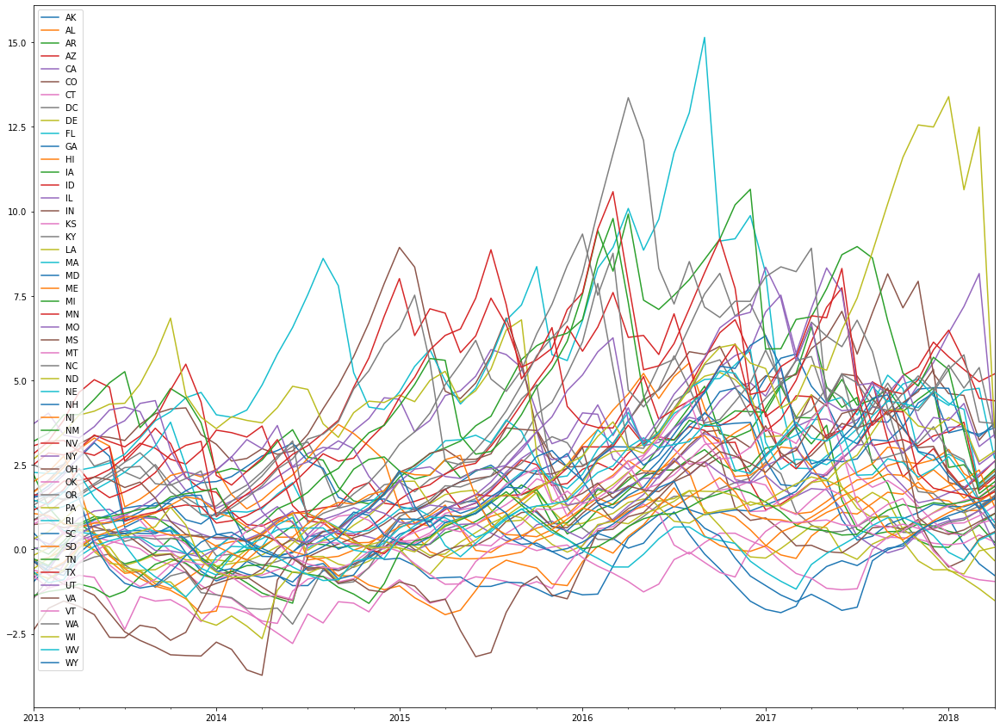

In [48]:
## plotting to see if all went through
fig, ax = plt.subplots(figsize=(20,15))
for state_df in state_dfs:
    state_df['2013':'2018'].sharpe_ratio_monthly.plot(label =state_df.columns[0], ax=ax)
plt.legend(loc=2)

In [60]:
st = []
average_5 = []
average_10 = []
avg_10_y = []
avg_5_y= []
avg_1_mo =[]
avg_1_y=[]
avg_3_mo =[]
avg_3_y=[]
for state in state_dfs:
    st.append(state.columns[0])
    avg_1_mo.append(state['2017-04-01':].sharpe_ratio_monthly.mean())
    avg_1_y.append(state['2017-04-01':].sharpe_ratio_annual.mean())
    average_5.append(state['2013':'2018'].sharpe_ratio_monthly.mean())
    average_10.append(state['2008':'2018'].sharpe_ratio_monthly.mean())
    avg_5_y.append(state['2013':'2018'].sharpe_ratio_annual.mean())
    avg_10_y.append(state['2008':'2018'].sharpe_ratio_annual.mean())
    avg_3_mo.append(state['2015-04-01':].sharpe_ratio_monthly.mean())
    avg_3_y.append(state['2015-04-01':].sharpe_ratio_annual.mean())

state_averages = pd.concat([pd.DataFrame(st,dtype='str'),pd.DataFrame(avg_1_mo,dtype=float),pd.DataFrame(avg_1_y,dtype=float),
                            pd.DataFrame(avg_3_mo,dtype=float),pd.DataFrame(avg_3_y,dtype=float),
                            pd.DataFrame(average_5,dtype=float),pd.DataFrame(avg_5_y,dtype=float),
                                pd.DataFrame(average_10,dtype=float),pd.DataFrame(avg_10_y,dtype=float)],axis=1)
state_averages.columns = ['state','1yr_average_mo','1yr_average_y',
                          '3yr_average_mo','3yr_average_y',
                          '5yr_average_mo','5yr_average_y',
                          '10yr_average_mo','10yr_average_y']


Text(0, 0.5, '10 Year Average Sharpe Ratio (annual)')

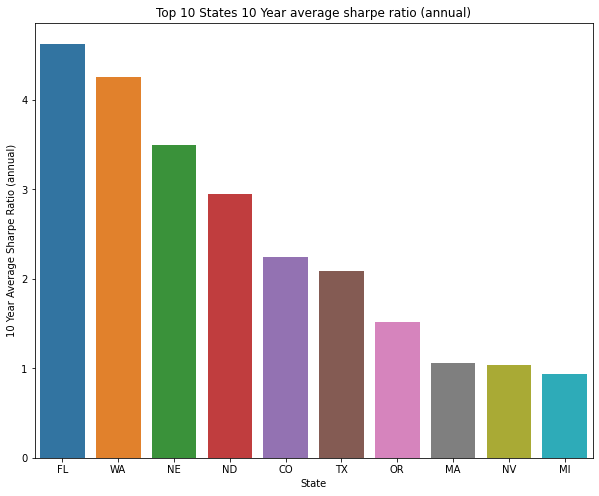

In [52]:
sns.barplot(x='state',y='10yr_average_y',data=state_averages.sort_values('10yr_average_y',ascending=False).head(10))
plt.title('Top 10 States 10 Year average sharpe ratio (annual)')
plt.xlabel('State')
plt.ylabel('10 Year Average Sharpe Ratio (annual)')

Text(0, 0.5, '10 Year Average Sharpe Ratio (monthly)')

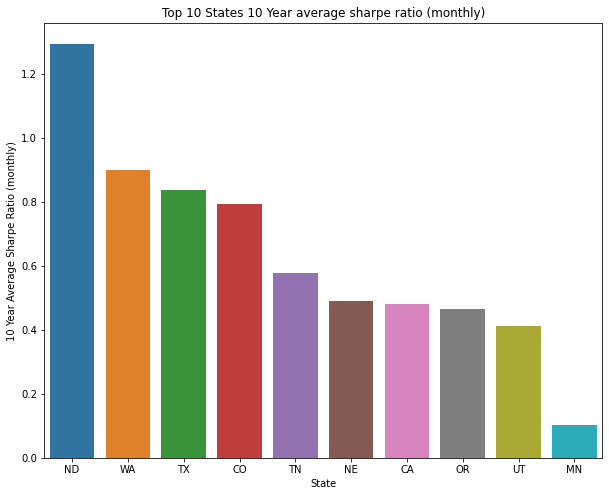

In [53]:
sns.barplot(x='state',y='10yr_average_mo',data=state_averages.sort_values('10yr_average_mo',ascending=False).head(10))
plt.title('Top 10 States 10 Year average sharpe ratio (monthly)')
plt.xlabel('State')
plt.ylabel('10 Year Average Sharpe Ratio (monthly)')

Looking at 10 year sharpe ratio which include the financial crisis of '08 WA, TX, CO, TN and CA are only states that where able to have positive sharpe ratios throughtout those volatile times pointing to a bit of safety in large market swings such as '08

Text(0, 0.5, '5 Year Average Sharpe Ratio (monthly)')

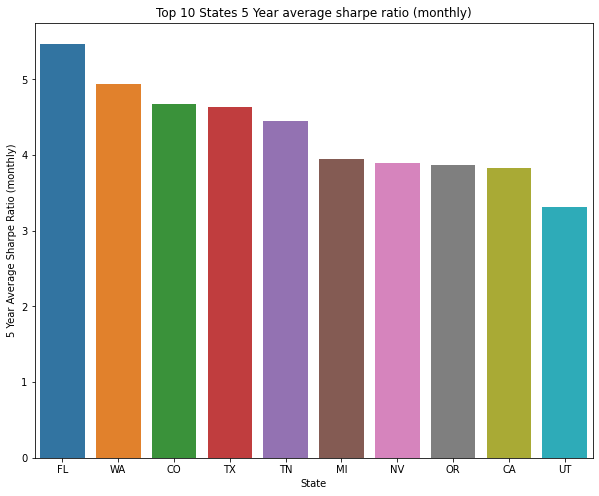

In [55]:
sns.barplot(x='state',y='5yr_average_mo',data=state_averages.sort_values('5yr_average_mo',ascending=False).head(10))
plt.title('Top 10 States 5 Year average sharpe ratio (monthly)')
plt.xlabel('State')
plt.ylabel('5 Year Average Sharpe Ratio (monthly)')

When only looking at 5yr sharpe ratios WA CO TX TN CA are still among the top 10 list but notice FL is now top performing state which may indicate that in FL, absent of a large downturn in the housing market, would provide the best risk adjusted returns

In [56]:
st10 = list(state_averages.sort_values('10yr_average_mo',ascending=False).state.head(10))
st10

['ND', 'WA', 'TX', 'CO', 'TN', 'NE', 'CA', 'OR', 'UT', 'MN']

In [57]:
st5 = list(state_averages.sort_values('5yr_average_mo',ascending=False).state.head(10))
st5

['FL', 'WA', 'CO', 'TX', 'TN', 'MI', 'NV', 'OR', 'CA', 'UT']

In [61]:
st3 = list(state_averages.sort_values('3yr_average_mo',ascending=False).state.head(10))
st1

['WI', 'CO', 'TN', 'WA', 'CA', 'MO', 'NV', 'OR', 'MA', 'AZ']

In [58]:
st1 = list(state_averages.sort_values('1yr_average_mo',ascending=False).state.head(10))
st1

['WI', 'CO', 'TN', 'WA', 'CA', 'MO', 'NV', 'OR', 'MA', 'AZ']

Text(0.5, 1.0, 'Top 10 States by 5 year Sharpe Ratio (annual)')

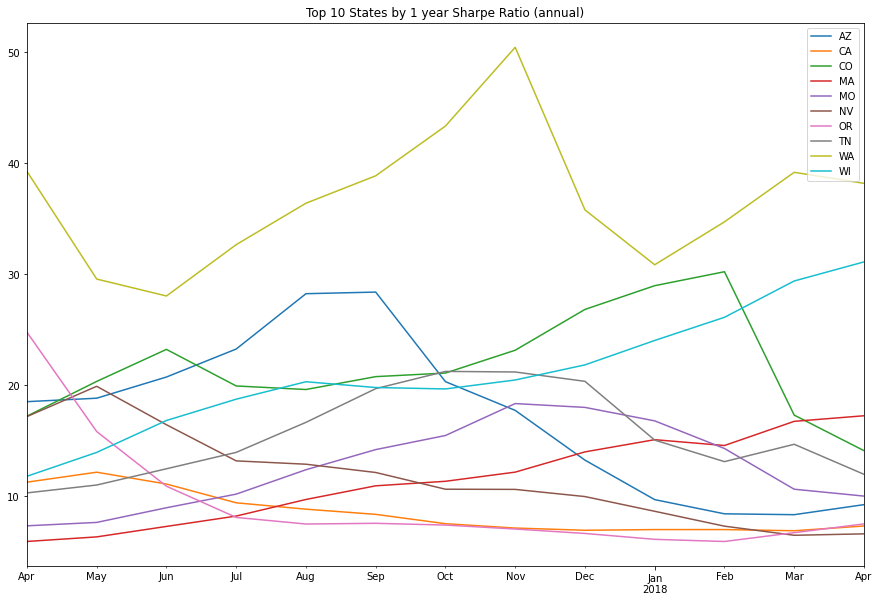

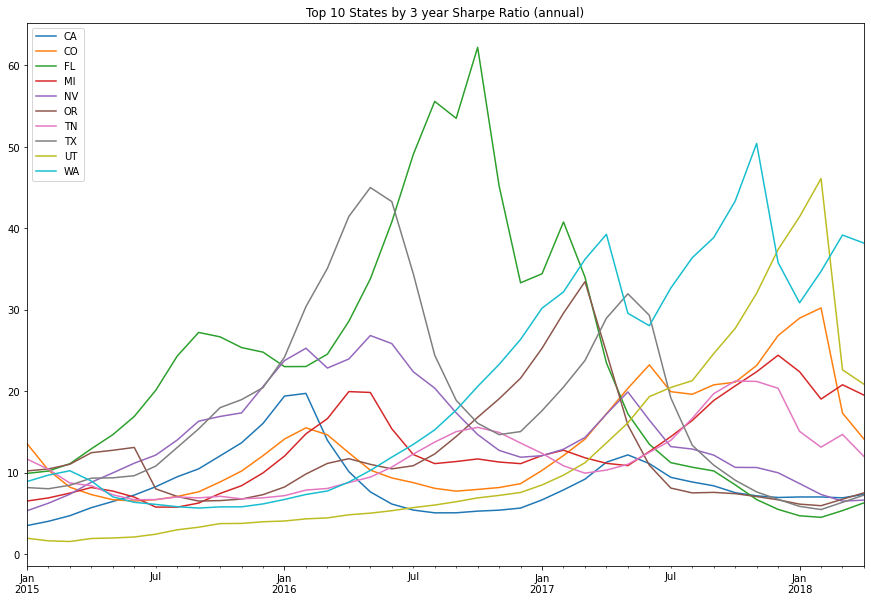

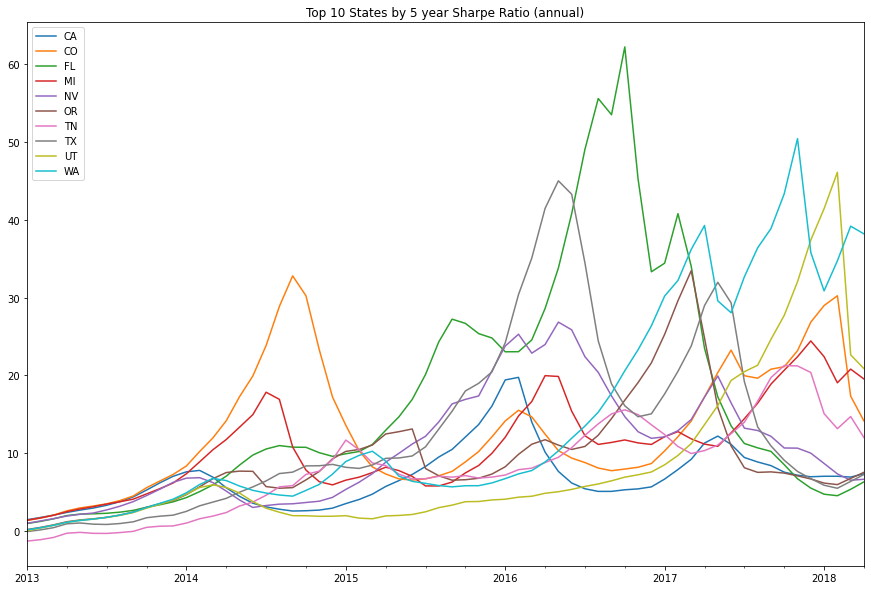

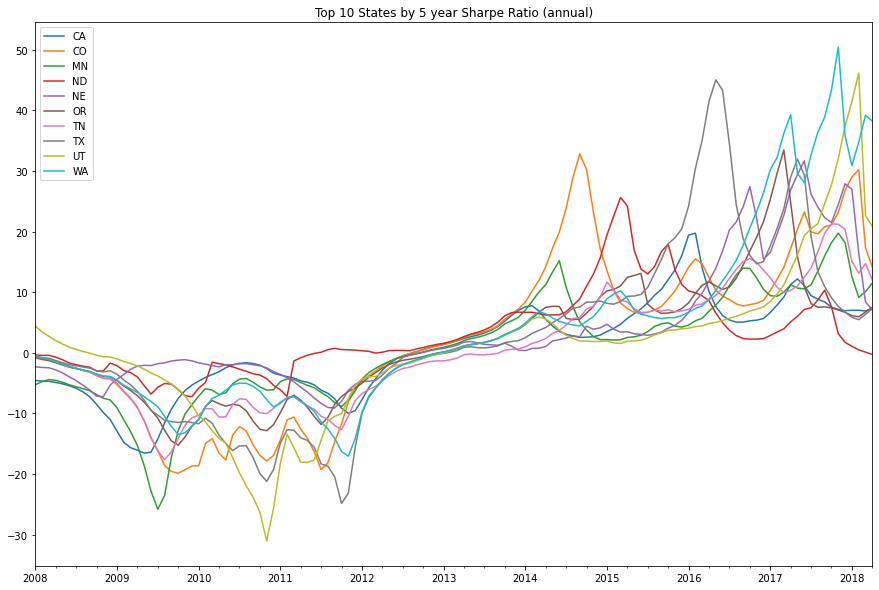

In [62]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st1:
        if x in state_df.columns[0]:
            state_df['2017-04-01':'2018'].sharpe_ratio_annual.plot(label=state_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 States by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st5:
        if x in state_df.columns[0]:
            state_df['2015':].sharpe_ratio_annual.plot(label=state_df.columns[0])
        else: continue
plt.legend()
plt.title('Top 10 States by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st5:
        if x in state_df.columns[0]:
            state_df['2013':'2018'].sharpe_ratio_annual.plot(label=state_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 States by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for state_df in state_dfs:
    for x in st10:
        if x in state_df.columns[0]:
            state_df['2008':'2018'].sharpe_ratio_annual.plot(label=state_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 States by 5 year Sharpe Ratio (annual)')

Looking at the most recent year, Washington, Wisconsin, and Massachussets are highest performing states wrt sharpe ratio

For 3 year time horizon, this remains the same, and with broader context these states are in an uptrend

for 5 year also same results but this in on YoY comparison so smoothes out trends

## Looking at Counties

In [66]:
counties = df.drop(columns=['RegionID','RegionName', 'City', 'Metro', 'State','SizeRank'],axis=1).groupby('CountyName').mean()
counties = pd.DataFrame(counties.reset_index())
county_columns = list(counties.T.iloc[0])
counties = counties.T
counties.columns = county_columns
counties = counties[1:]
counties = counties.set_index(pd.to_datetime(counties.index))
counties = counties.applymap(lambda x: round(np.float(x),2))

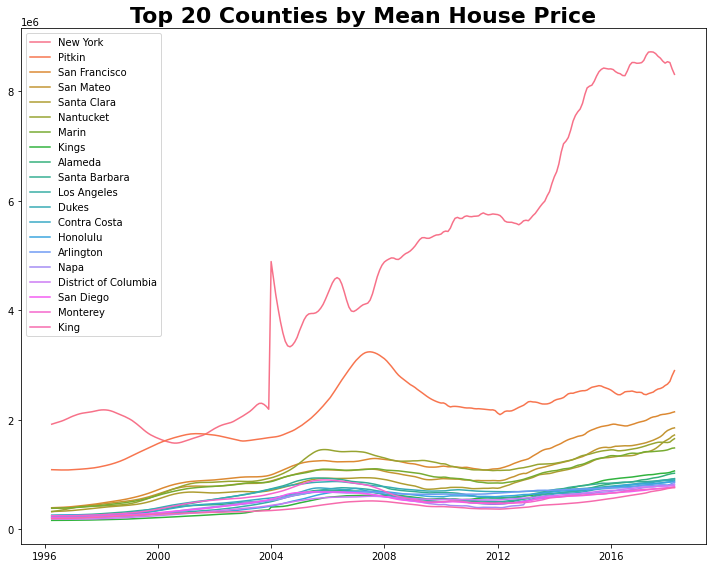

In [69]:
top20counties = list(counties.iloc[-1,:].sort_values(ascending=False).head(20).index)
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
rcParams['figure.figsize'] = 10,8
sns.lineplot(data=counties[top20counties],dashes=False)
plt.title('Top 20 Counties by Mean House Price',font=font)
plt.tight_layout()

No surprise New York County is certainly the most expensive by a vast margin followed by Pitkin and San Francisco

Notably, New york is in a decline from peak levels in 2016 while Pitkin is in an uptrend

After these counties and 3 or so others prices are hard to distinguish

In [72]:
county_list = list(counties.columns)
len(county_list)

1212

In [73]:
county_dfs = []
for x in county_list:
    x = pd.DataFrame(data = counties[x],)
    county_dfs.append(x)

In [84]:
county_dfs[0].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265 entries, 1996-04-01 to 2018-04-01
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Acadia                265 non-null    float64
 1   ROI_MoM               265 non-null    float64
 2   ROI_YoY               265 non-null    float64
 3   EMA_6MO_roi_mo        265 non-null    float64
 4   EMA_6MO_std_mo        264 non-null    float64
 5   EMA_6MO_roi_y         265 non-null    float64
 6   EMA_6MO_std_y         264 non-null    float64
 7   rfr                   265 non-null    float64
 8   sharpe_ratio_monthly  264 non-null    float64
 9   sharpe_ratio_annual   264 non-null    float64
dtypes: float64(10)
memory usage: 32.8 KB


In [74]:
for county_df in county_dfs:
    county_df['ROI_MoM'] = np.zeros((265))
    county_df['ROI_YoY'] = np.zeros((265))
    for x in range(0,265):    
        if x + 1 <265:
            county_df.iloc[x+1,1] = round((county_df.iloc[x+1,0] - county_df.iloc[x,0])/county_df.iloc[x,0],4)
        else: break
    for x in range(0,265):    
        if x + 12 <265:
            county_df.iloc[x+12,2] = round((county_df.iloc[x+12,0] - county_df.iloc[x,0])/county_df.iloc[x,0],4)
        else: break
    county_df['EMA_6MO_roi_mo'] = county_df.ROI_MoM.ewm(span=6,adjust=False).mean()
    county_df['EMA_6MO_std_mo'] = county_df.ROI_MoM.ewm(span=6,adjust=False).std()
    county_df['EMA_6MO_roi_y'] = county_df.ROI_YoY.ewm(span=6,adjust=False).mean()
    county_df['EMA_6MO_std_y'] = county_df.ROI_YoY.ewm(span=6,adjust=False).std()
    county_df['rfr'] = rfr.DGS10
    county_df['sharpe_ratio_monthly'] = (county_df['EMA_6MO_roi_mo'] - (county_df.rfr/12))/county_df['EMA_6MO_std_mo']
    county_df['sharpe_ratio_annual'] = (county_df['EMA_6MO_roi_y'] - (county_df.rfr))/county_df['EMA_6MO_std_y']

In [104]:
ct = []
avg_5_mo = []
avg_5_y = []
avg_10_mo = []
avg_10_y= []
avg_1_mo =[]
avg_1_y=[]
avg_3_mo = []
avg_3_y = []
for county in county_dfs:
    ct.append(county.columns[0])
    avg_1_mo.append(county['2017-04-01':].sharpe_ratio_monthly.mean())
    avg_1_y.append(county['2017-04-01':].sharpe_ratio_annual.mean())
    avg_5_mo.append(county['2013':'2018'].sharpe_ratio_monthly.mean())
    avg_5_y.append(county['2013':'2018'].sharpe_ratio_annual.mean())
    avg_10_mo.append(county['2008':'2018'].sharpe_ratio_monthly.mean())
    avg_10_y.append(county['2008':'2018'].sharpe_ratio_annual.mean())
    avg_3_mo.append(county['2015-04-01':].sharpe_ratio_monthly.mean())
    avg_3_y.append(county['2015-04-01':].sharpe_ratio_annual.mean())
county_averages = pd.concat([pd.DataFrame(ct,dtype='str'),pd.DataFrame(avg_1_mo,dtype=float),pd.DataFrame(avg_1_y,dtype=float),
                            pd.DataFrame(avg_3_mo,dtype=float),pd.DataFrame(avg_3_y,dtype=float),
                            pd.DataFrame(avg_5_mo,dtype=float),pd.DataFrame(avg_5_y,dtype=float),
                                pd.DataFrame(avg_10_mo,dtype=float),pd.DataFrame(avg_10_y,dtype=float)],axis=1)
county_averages.columns = ['county','1yr_average_mo','1yr_average_y',
                          '3yr_average_mo','3yr_average_y',
                          '5yr_average_mo','5yr_average_y',
                          '10yr_average_mo','10yr_average_y']


In [130]:
## no duplicate counties
county_averages.county.duplicated().sum()

0

In [120]:
county_averages.sort_values('10yr_average_mo',ascending=False).head(10)

,county,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y
1160,Weld,2.978539,10.864722,3.490653,13.983613,4.791624,11.705562,1.510904,2.742040
26,Arapahoe,2.435483,12.096049,3.877805,9.659439,3.946555,9.144958,1.349821,2.647306
1043,Stutsman,0.609223,3.707633,1.137632,4.685899,2.380254,6.571210,1.295704,3.208507
101,Bottineau,1.480174,5.867193,2.074726,7.888051,2.090334,7.676780,1.249943,4.454781
1101,Uintah,6.091715,12.836897,5.210016,10.970244,4.066645,8.077180,1.212724,1.378754
1063,Tarrant,4.268761,16.906491,5.679534,13.607377,4.101728,9.041270,1.159421,2.640335
736,Morton,-0.001875,-0.037152,0.610232,2.533059,1.715236,4.517546,1.099789,2.700974
385,Gaines,1.600449,7.970290,2.449739,10.986220,2.689594,9.305772,1.097479,3.746491
570,King,3.333670,31.328247,5.433629,21.174357,4.377548,14.309619,1.066469,4.646510
51,Barnes,-0.103402,0.029829,0.435432,2.531147,1.518385,4.655364,1.005266,2.909366


In [133]:
counties["Skagit"].mean()

222514.19811320756

In [124]:
ct10= []
ct10 = list(county_averages.sort_values('10yr_average_mo',ascending=False).county.head(10))
ct10

['Weld',
 'Arapahoe',
 'Stutsman',
 'Bottineau',
 'Uintah',
 'Tarrant',
 'Morton',
 'Gaines',
 'King',
 'Barnes']

In [91]:
ct5 = list(county_averages.sort_values('5yr_average_mo',ascending=False).county.head(10))
ct5

['Weld',
 'King',
 'Tarrant',
 'Uintah',
 'Arapahoe',
 'Clark',
 'Davidson',
 'Denver',
 'Payette',
 'Glenn']

In [106]:
ct3 = list(county_averages.sort_values('3yr_average_mo',ascending=False).county.head(10))
ct3

['Tarrant',
 'King',
 'Uintah',
 'Clark',
 'Jefferson',
 'Denver',
 'Payette',
 'Hood River',
 'Davidson',
 'Skagit']

In [92]:
ct1 = list(county_averages.sort_values('1yr_average_mo',ascending=False).county.head(10))
ct1

['Uintah',
 'Citrus',
 'Seminole',
 'Snohomish',
 'Skagit',
 'Mecklenburg',
 'Carson City',
 'Kent',
 'Clark',
 'Knox']

Text(0.5, 1.0, 'Top 10 Counties by 10 year Sharpe Ratio (annual)')

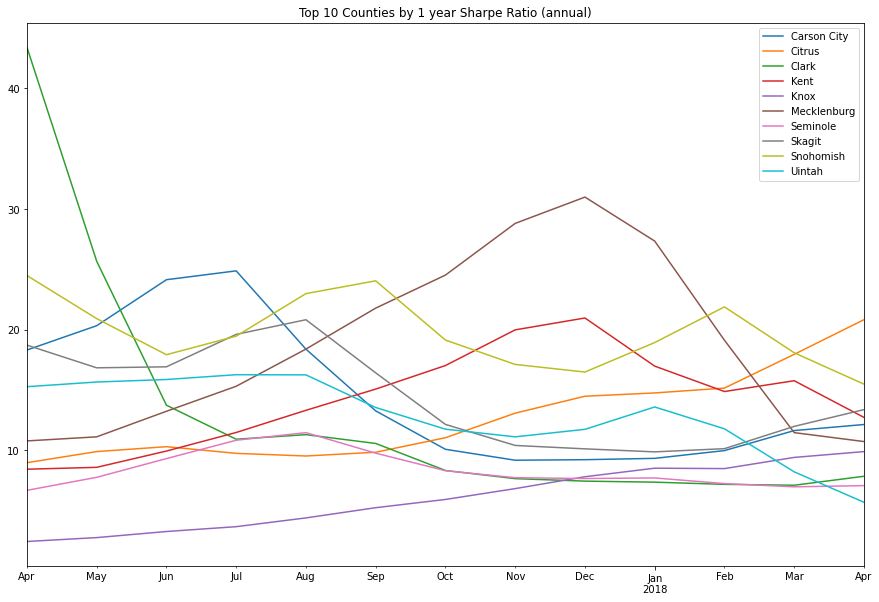

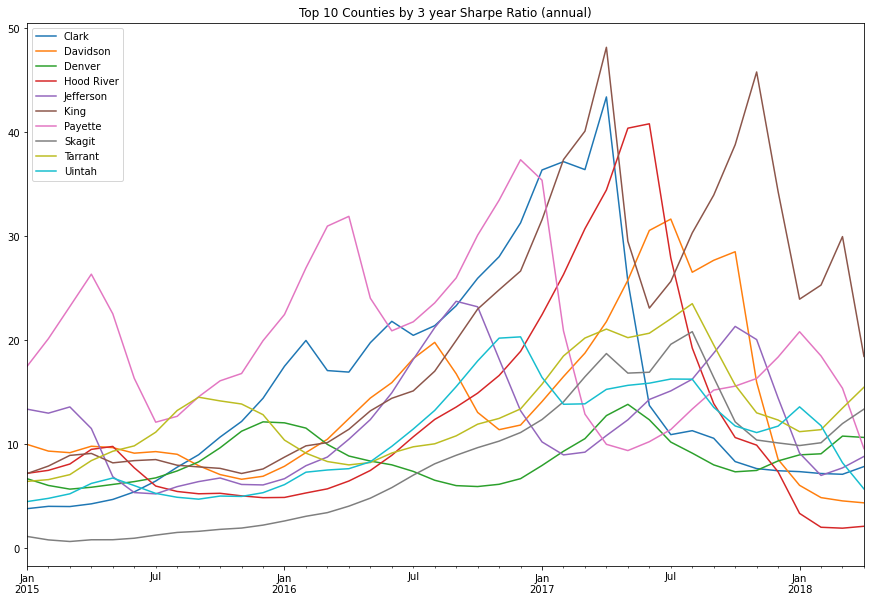

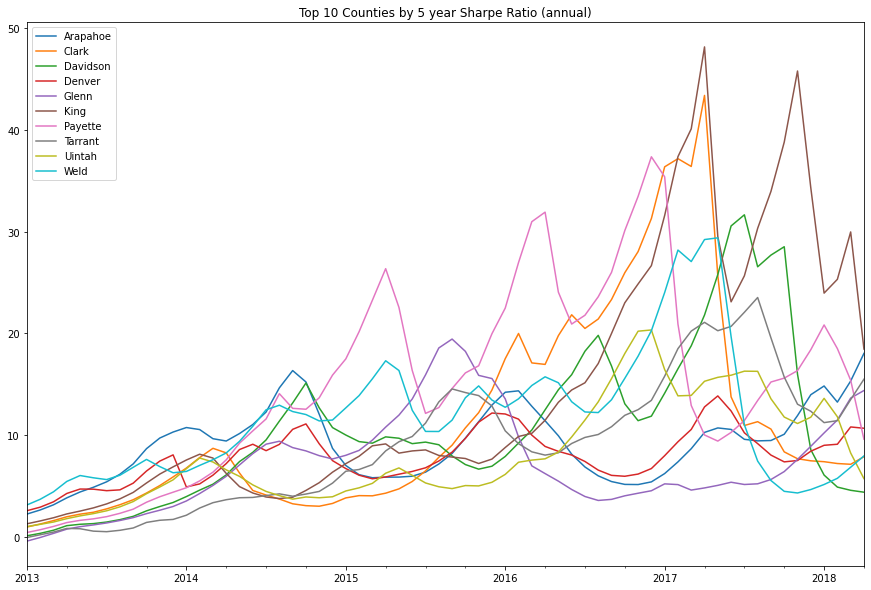

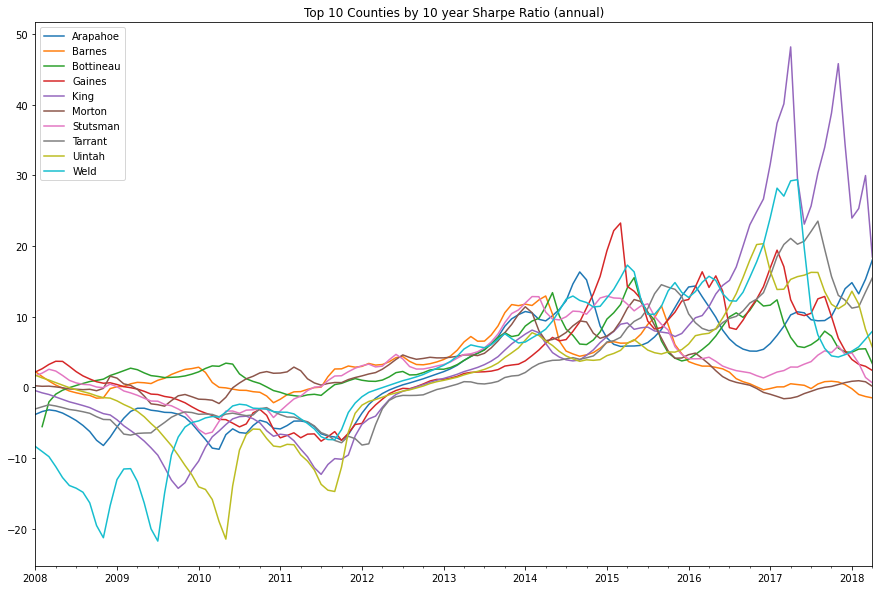

In [127]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct1:
        if x == county_df.columns[0]:
            county_df['2017-04-01':'2018'].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct3:
        if x == county_df.columns[0]:
            county_df['2015':].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct5:
        if x == county_df.columns[0]:
            county_df['2013':'2018'].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct10:
        if x == county_df.columns[0]:
            county_df['2008':'2018'].sharpe_ratio_annual.plot(label=county_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 10 year Sharpe Ratio (annual)')

Araphoe, Glenn, Tarrant, King (maybe) could be late to the game there but still in 20s sharpe tbd but that gives us texas CO and WA

Text(0.5, 1.0, 'Top 10 Counties by 10 year Sharpe Ratio (mo)')

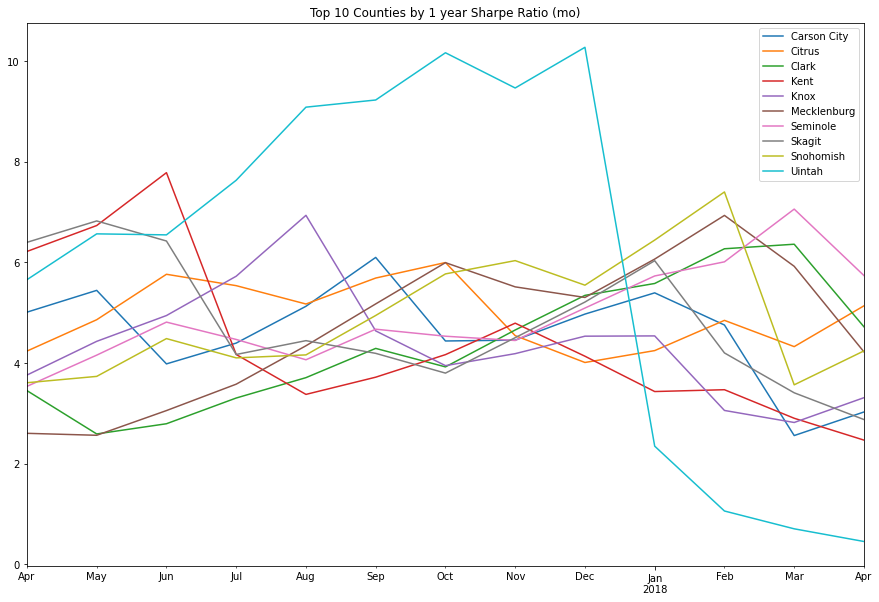

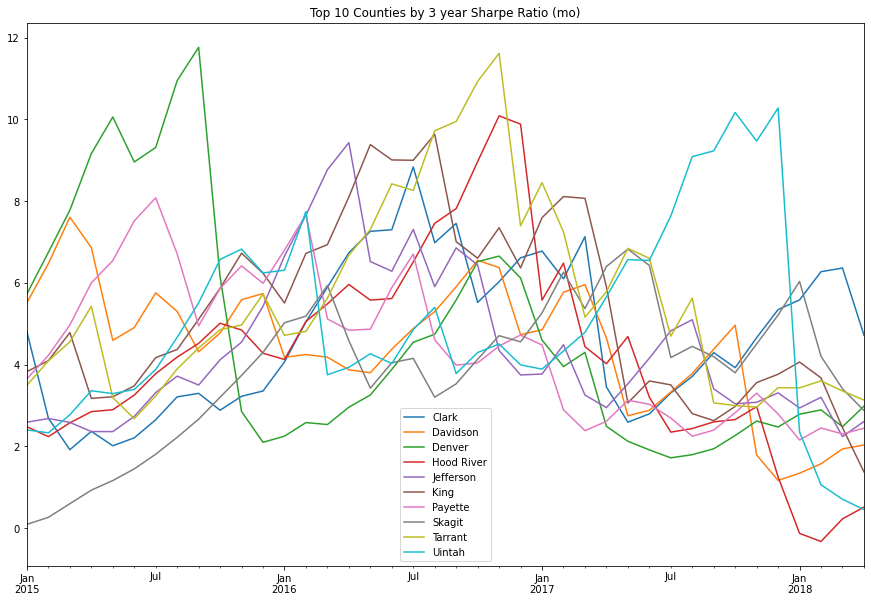

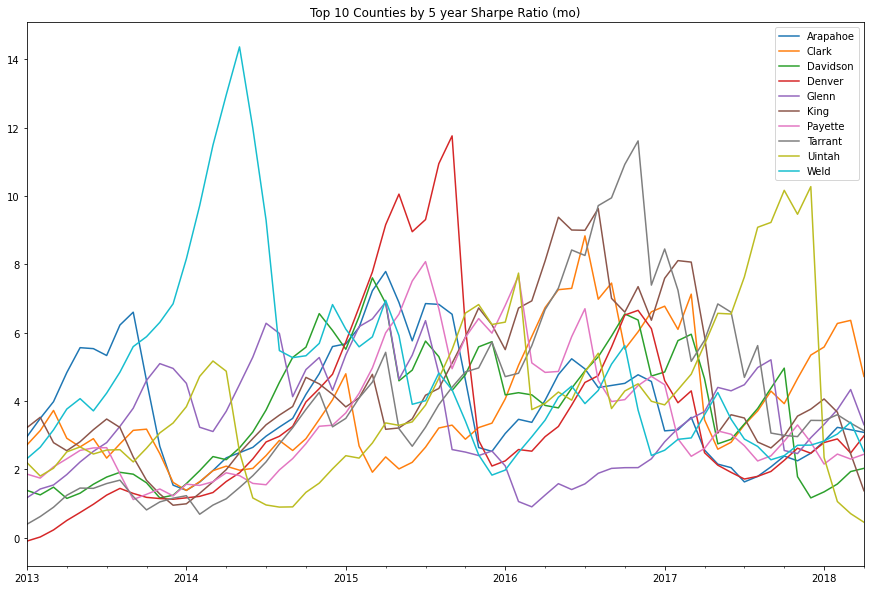

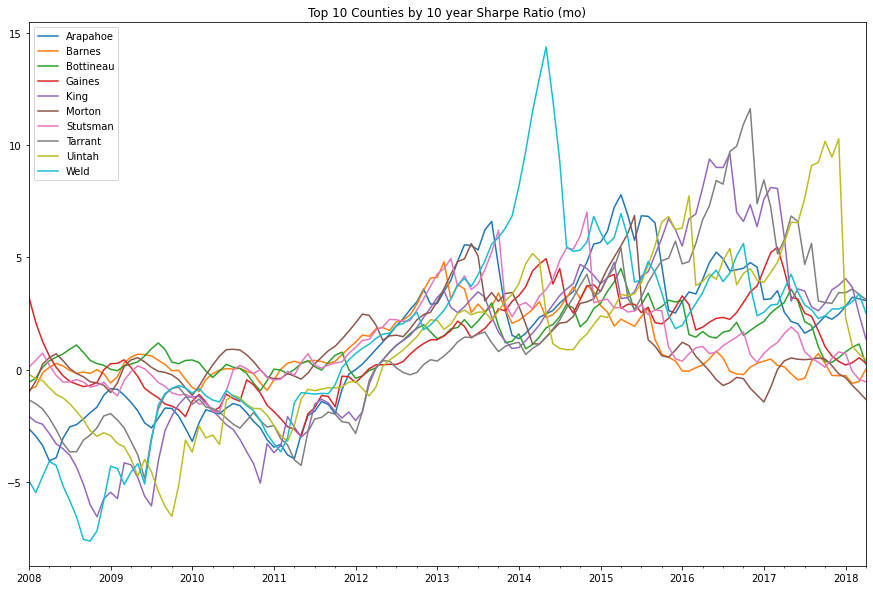

In [128]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct1:
        if x == county_df.columns[0]:
            county_df['2017-04-01':'2018'].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 1 year Sharpe Ratio (mo)')

fig, ax = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct3:
        if x == county_df.columns[0]:
            county_df['2015':].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 3 year Sharpe Ratio (mo)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct5:
        if x == county_df.columns[0]:
            county_df['2013':'2018'].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 5 year Sharpe Ratio (mo)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct10:
        if x == county_df.columns[0]:
            county_df['2008':'2018'].sharpe_ratio_monthly.plot(label=county_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 10 year Sharpe Ratio (mo)')

Text(0.5, 1.0, 'Top 10 Counties ROI by 10 year Sharpe Ratio (annual)')

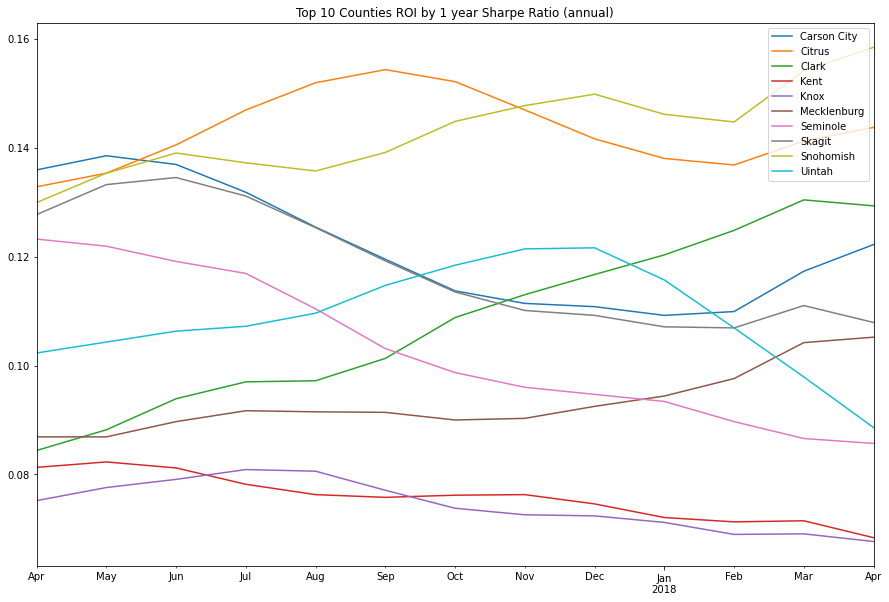

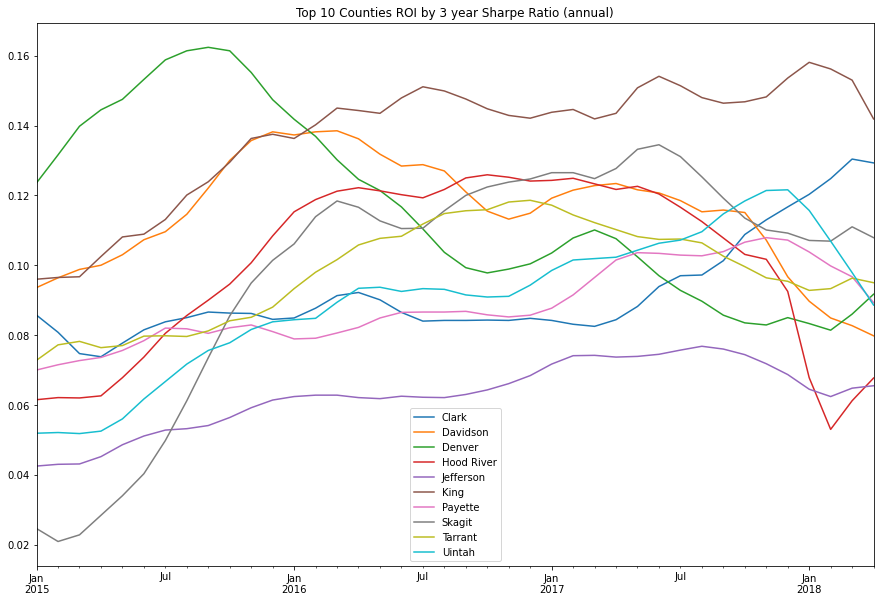

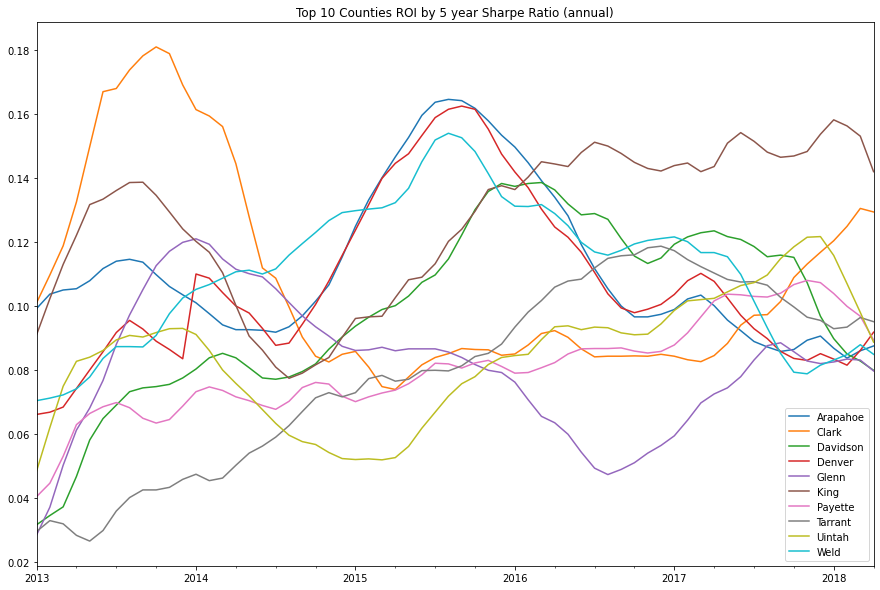

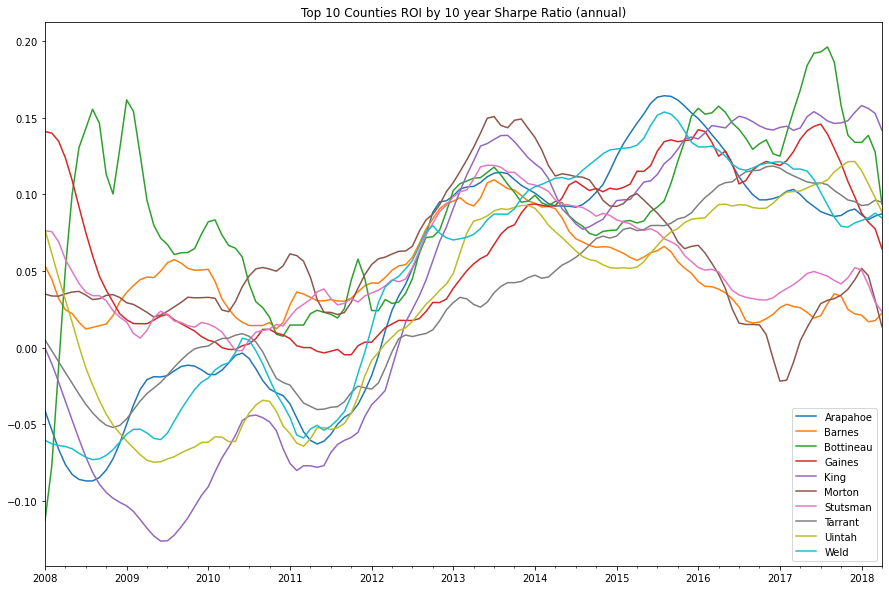

In [135]:
fig1, ax1 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct1:
        if x == county_df.columns[0]:
            county_df['2017-04-01':'2018'].ROI_YoY.plot(label=county_df.columns[0],ax=ax1)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct3:
        if x == county_df.columns[0]:
            county_df['2015':].ROI_YoY.plot(label=county_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct5:
        if x == county_df.columns[0]:
            county_df['2013':'2018'].ROI_YoY.plot(label=county_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(15,10))
for county_df in county_dfs:
    for x in ct10:
        if x == county_df.columns[0]:
            county_df['2008':'2018'].ROI_YoY.plot(label=county_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Counties ROI by 10 year Sharpe Ratio (annual)')

In [137]:
df[df.CountyName == 'Arapahoe'].

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,1997-01,1997-02,1997-03,1997-04,1997-05,1997-06,1997-07,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,1998-06,1998-07,1998-08,1998-09,1998-10,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
129,93203,80013,Aurora,CO,Denver,Arapahoe,130,123600.0,123700.0,123700.0,123800.0,123900.0,124000.0,124100.0,124300.0,124600.0,125100.0,125600.0,126000.0,126400.0,126900.0,127400.0,128000.0,128600.0,129200.0,129800.0,130600.0,131400.0,132300.0,133100.0,133800.0,134500.0,135100.0,135800.0,136400.0,137000.0,137600.0,138400.0,139300.0,140300.0,141400.0,142600.0,143800.0,145200.0,146500.0,148100.0,149700.0,151400.0,153200.0,155100.0,156900.0,158900.0,160900.0,162800.0,164700.0,166600.0,168500.0,170500.0,172400.0,174300.0,176100.0,177900.0,179700.0,181400.0,183100.0,184600.0,186000.0,187100.0,188200.0,189100.0,190000.0,190800.0,191600.0,192400.0,193100.0,193900.0,194700.0,195500.0,196200.0,196800.0,197300.0,197600.0,197900.0,198000.0,198100.0,198200.0,198200.0,198200.0,198100.0,198100.0,198300.0,198700.0,199300.0,199800.0,200300.0,200700.0,201100.0,201700.0,202300.0,202700.0,203100.0,203400.0,203400.0,203400.0,203300.0,203400.0,203600.0,203800.0,204000.0,204100.0,204300.0,204600.0,205000.0,205400.0,205900.0,206400.0,206800.0,207200.0,207500.0,207900.0,208200.0,208600.0,208800.0,209000.0,209300.0,209500.0,209400.0,209100.0,208500.0,207900.0,207100.0,206300.0,205600.0,205000.0,204400.0,203900.0,203800.0,204000.0,204200.0,204300.0,204500.0,204500.0,204200.0,203800.0,203100.0,202100.0,200700.0,198900.0,196800.0,194600.0,192000.0,189700.0,188000.0,186800.0,185600.0,184500.0,183500.0,182700.0,182000.0,181500.0,181200.0,181000.0,180200.0,178800.0,177400.0,176100.0,175400.0,175400.0,176000.0,176800.0,177400.0,178000.0,178700.0,179200.0,180100.0,181700.0,183000.0,182900.0,182400.0,181300.0,179500.0,177700.0,176400.0,175300.0,173400.0,171200.0,169500.0,167900.0,165900.0,164600.0,163700.0,163200.0,162600.0,162000.0,162200.0,162500.0,162600.0,163300.0,164500.0,165800.0,167800.0,170100.0,172500.0,174500.0,176

## Looking at Cities

In [139]:
cities = df.drop(columns=['RegionID','RegionName', 'CountyName', 'Metro', 'State','SizeRank'],axis=1).groupby('City').mean()
cities = pd.DataFrame(cities.reset_index())
city_columns = list(cities.T.iloc[0])
cities = cities.T
cities.columns = city_columns
cities = cities[1:]
cities = cities.set_index(pd.to_datetime(cities.index))
cities = cities.applymap(lambda x: round(np.float(x),2))

In [142]:
cities

,Abbeville,Aberdeen,Abilene,Abingdon,Abington,Abita Springs,Absecon,Acampo,Accident,Accokeek,Ackerman,Acton,Acushnet,Acworth,Ada,Adair,Adairsville,Adams,Adams Center,Adamstown,Adamsville,Addis,Addison,Adel,Adelanto,Adrian,Advance,Affton,Afton,Agawam,Agoura Hills,Ahwahnee,Aiea,Aiken,Airville,Airway Heights,Ajo,Akron,Alabaster,Alachua,Alameda,Alamo,Alamosa,Alanson,Albany,Albers,Albertson,Albertville,Albion,Albuquerque,Alburtis,Alcoa,Alcolu,Alden,Aldie,Aldine,Aledo,Alexander,Alexander City,Alexandria,Alford,Algonac,Algonquin,Alhambra,Alice,Aliso Viejo,Allegan,Allegany,Allegheny,Allen,Allen Park,Allendale,Allenhurst,Allenspark,Allentown,Alliance,Allons,Allouez,Allyn,Alma,Almo,Almond,Almont,Alpharetta,Alpine,Alsip,Alstead,Altadena,Altamont,Altamonte Springs,Altavista,Alto,Alton,Altona,Altoona,Altura,Altus,Alva,Alvarado,Alvaton,Alvin,Alvord,Amado,Amagansett,Amanda,Amarillo,Amboy,Ambridge,Amelia,American Canyon,American Falls,American Fork,Ames,Amesbury,Amherst,Amherst Junction,Amity,Amityville,Ammon,Amory,Anacoco,Anaconda,Anacortes,Anaheim,Anahuac,Anchorage,Ancram,Andale,Andalusia,Anderson,Andersonville,Andes,Andover,Andrews,Angelica,Angels,Angie,Angier,Angleton,Angola,Angwin,Ankeny,Ann Arbor,Anna,Anna Maria,Annandale,Annapolis,Annsville,Annville,Anson,...,Winder,Windermere,Windham,Windsor,Windsor Heights,Windsor Mill,Winfield,Wingate,Winlock,Winnabow,Winnebago,Winneconne,Winnetka,Winnie,Winnsboro,Winona,Winona Lake,Winslow,Winsted,Winston,Winston-Salem,Winter Garden,Winter Haven,Winter Park,Winter Springs,Winters,Winterville,Winthrop,Winthrop Harbor,Winton,Wirtz,Wisconsin Rapids,Wister,Witt,Wixom,Woburn,Wofford Heights,Wolcott,Wolcottville,Wolf,Wolf River,Wolfe City,Wolfeboro,Wolverine,Womelsdorf,Wonder Lake,Wood Dale,Wood Ridge,Wood River,Woodacre,Woodbine,Woodbridge,Woodburn,Woodbury,Woodbury Heights,Woodcliff Lake,Woodcock,Woodford,Woodinville,Woodlake,Woodland,Woodland Park,Woodlawn,Woodleaf,Woodlyn,Woodmere,Woodridge,Woodruff,Woods Cross,Woods Hole,Woodsboro,Woodstock,Woodville,Woodward,Woodway,Woodworth,Woolwich,Woonsocket,Wooster,Worcester,Worland,Worth,Worthington,Worton,Wrenshall,Wrentham,Wright,Wright City,Wrightstown,Wrightwood,Wyandanch,Wyandotte,Wyckoff,Wylie,Wynnewood,Wyoming,Wyomissing,Xenia,Yachats,Yacolt,Yakima,Yalaha,Yale,Yamhill,Yankton,Yaphank,Yarmouth,Yates,Yates Center,Yates City,Yatesville,Yellow Springs,Yelm,Yerington,Yoakum,Yoncalla,Yonkers,Yorba Linda,York,Yorkshire,Yorktown,Yorkville,Youngstown,Youngsville,Youngtown,Youngwood,Yountville,Ypsilanti,Yreka,Yuba City,Yucaipa,Yucca Valley,Yukon,Yulee,Yuma,Zachary,Zanesville,Zebulon,Zeeland,Zelienople,Zephyr Cove,Zephyrhills,Zillah,Zimmerman,Zion,Zionsville,Zionville,Zumbro Falls,Zumbrota,Zuni
1996-04-01,47900.0,85575.0,62300.00,73575.0,144780.0,72000.0,105500.0,182000.0,48300.0,206800.0,NaN,245550.0,110200.0,119350.0,42200.0,44900.0,NaN,85533.33,56700.0,210900.0,40250.0,84800.0,124275.0,115800.0,94700.0,52500.0,107300.0,86100.0,115700.0,117400.0,322700.0,138800.0,246000.0,70300.00,83700.0,93500.0,43800.0,70050.00,115650.0,68700.0,223000.0,389100.0,52100.0,NaN,92456.25,NaN,244100.0,117000.0,56500.00,129346.67,106700.0,61800.0,46600.0,92600.0,254600.0,56200.0,143800.0,87500.0,61900.0,67466.67,43200.0,85100.0,182200.0,144133.33,61200.0,215500.0,49700.0,66200.0,62966.67,167633.33,88500.0,213150.0,71600.0,123500.0,65733.33,54400.0,24800.0,94500.0,139600.0,61400.0,56900.0,45500.0,120500.0,180900.0,436825.0,125600.0,88300.0,187300.0,56100.0,90450.0,58800.0,114200.0,77275.0,28200.0,55950.0,72300.0,47200.0,94200.0,76700.0,71200.0,84800.0,NaN,91000.0,328400.0,64200.0,71987.5,121500.0,48100.0,96700.0,169100.0,84600.0,199600.0,93000.0,132200.0,126870.0,114700.0,85133.33,123300.0,91300.0,NaN,89800.0,109900.0,158700.0,182285.71,51700.0,139415.38,113300.0,75000.0,107150.0,69750.0,73100.0,68900.0,108800.00,45600.0,32300.0,133400.0,43200.0,76700.0,69700.0,80500.0,247000.0,92800.0,165933.33,96300.0,210000.0,150700.0,201050.0,55800.0,127800.0,43600.0,...,81700.0,191400.0,107133.3

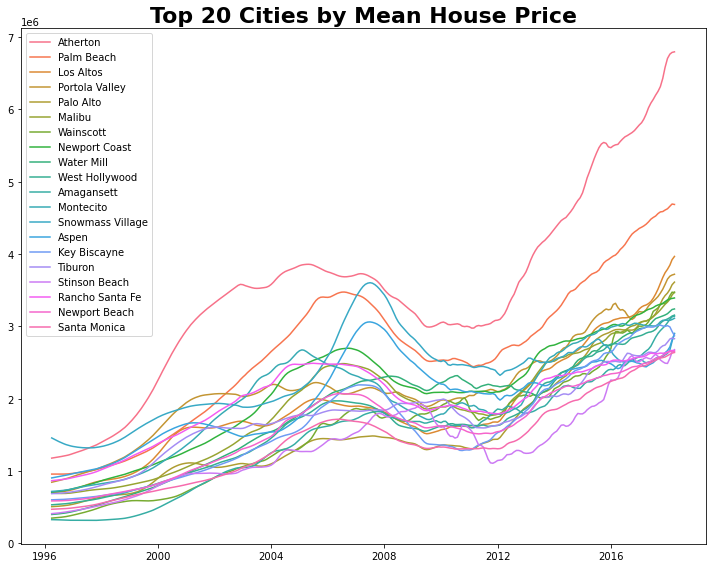

In [145]:
top20cities = list(cities.iloc[-1,:].sort_values(ascending=False).head(20).index)
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
rcParams['figure.figsize'] = 10,8
sns.lineplot(data=cities[top20cities],dashes=False)
plt.title('Top 20 Cities by Mean House Price',font=font)
plt.tight_layout()

In [146]:
city_list = list(cities.columns)
len(city_list)

7554

In [147]:
city_dfs = []
for x in city_list:
    x = pd.DataFrame(data = cities[x])
    city_dfs.append(x)

In [148]:
for city_df in city_dfs:
    city_df['ROI_MoM'] = np.zeros((265))
    city_df['ROI_YoY'] = np.zeros((265))
    for x in range(0,265):    
        if x + 1 <265:
            city_df.iloc[x+1,1] = round((city_df.iloc[x+1,0] - city_df.iloc[x,0])/city_df.iloc[x,0],4)
        else: break
    for x in range(0,265):    
        if x + 12 <265:
            city_df.iloc[x+12,2] = round((city_df.iloc[x+12,0] - city_df.iloc[x,0])/city_df.iloc[x,0],4)
        else: break
    city_df['EMA_6MO_roi_mo'] = city_df.ROI_MoM.ewm(span=6,adjust=False).mean()
    city_df['EMA_6MO_std_mo'] = city_df.ROI_MoM.ewm(span=6,adjust=False).std()
    city_df['EMA_6MO_roi_y'] = city_df.ROI_YoY.ewm(span=6,adjust=False).mean()
    city_df['EMA_6MO_std_y'] = city_df.ROI_YoY.ewm(span=6,adjust=False).std()
    city_df['rfr'] = rfr.DGS10
    city_df['sharpe_ratio_monthly'] = (city_df['EMA_6MO_roi_mo'] - (city_df.rfr/12))/city_df['EMA_6MO_std_mo']
    city_df['sharpe_ratio_annual'] = (city_df['EMA_6MO_roi_y'] - (city_df.rfr))/city_df['EMA_6MO_std_y']

In [159]:
cities.columns

Index(['Abbeville', 'Aberdeen', 'Abilene', 'Abingdon', 'Abington',
       'Abita Springs', 'Absecon', 'Acampo', 'Accident', 'Accokeek',
       ...
       'Zephyr Cove', 'Zephyrhills', 'Zillah', 'Zimmerman', 'Zion',
       'Zionsville', 'Zionville', 'Zumbro Falls', 'Zumbrota', 'Zuni'],
      dtype='object', length=7554)

In [163]:
cty = list(cities.columns)
avg_5_mo = []
avg_5_y = []
avg_10_mo = []
avg_10_y= []
avg_1_mo =[]
avg_1_y=[]
avg_3_mo = []
avg_3_y = []
for city in city_dfs:
    avg_1_mo.append(city['2017-04-01':].sharpe_ratio_monthly.mean())
    avg_1_y.append(city['2017-04-01':].sharpe_ratio_annual.mean())
    avg_5_mo.append(city['2013':'2018'].sharpe_ratio_monthly.mean())
    avg_5_y.append(city['2013':'2018'].sharpe_ratio_annual.mean())
    avg_10_mo.append(city['2008':'2018'].sharpe_ratio_monthly.mean())
    avg_10_y.append(city['2008':'2018'].sharpe_ratio_annual.mean())
    avg_3_mo.append(city['2015-04-01':].sharpe_ratio_monthly.mean())
    avg_3_y.append(city['2015-04-01':].sharpe_ratio_annual.mean())
city_averages = pd.concat([pd.DataFrame(cty,dtype='str'),pd.DataFrame(avg_1_mo,dtype=float),pd.DataFrame(avg_1_y,dtype=float),
                            pd.DataFrame(avg_3_mo,dtype=float),pd.DataFrame(avg_3_y,dtype=float),
                            pd.DataFrame(avg_5_mo,dtype=float),pd.DataFrame(avg_5_y,dtype=float),
                                pd.DataFrame(avg_10_mo,dtype=float),pd.DataFrame(avg_10_y,dtype=float)],axis=1)
city_averages.columns = ['city','1yr_average_mo','1yr_average_y',
                          '3yr_average_mo','3yr_average_y',
                          '5yr_average_mo','5yr_average_y',
                          '10yr_average_mo','10yr_average_y']

In [169]:
cty10 = list(city_averages.sort_values('10yr_average_mo',ascending=False).city.head(20))
cty5 = list(city_averages.sort_values('5yr_average_mo',ascending=False).city.head(20))
cty3 =list(city_averages.sort_values('3yr_average_mo',ascending=False).city.head(20))
cty1 =list(city_averages.sort_values('1yr_average_mo',ascending=False).city.head(20))

In [165]:
city_averages

,city,1yr_average_mo,1yr_average_y,3yr_average_mo,3yr_average_y,5yr_average_mo,5yr_average_y,10yr_average_mo,10yr_average_y
0,Abbeville,0.725218,1.148212,0.508909,1.227817,0.208169,0.298758,-0.307993,-1.395024
1,Aberdeen,1.432191,7.256682,1.036776,3.400840,0.449292,1.029676,-0.751696,-1.745393
2,Abilene,1.260883,4.019493,1.285671,2.749937,0.951812,2.080541,-0.769782,-1.292969
3,Abingdon,0.567860,0.955638,-0.007157,-0.684370,-0.315535,-0.930389,-1.475996,-2.321783
4,Abington,1.741072,3.851651,1.321929,3.054870,0.741023,1.087130,-1.032671,-5.056088
...,...,...,...,...,...,...,...,...,...
7549,Zionsville,1.628670,3.196498,0.793265,1.480112,0.284821,0.469666,-1.810943,-4.266708
7550,Zionville,0.601221,2.246007,0.651907,1.917999,0.275764,0.555419,-0.506529,-1.835116
7551,Zumbro Falls,1.987951,5.130182,1.932429,5.467237,1.033701,2.399644,0.018032,-0.403149
7552,Zumbrota,0.503352,4.772632,0.683801,4.942041,0.569449,3.481128,-0.573384,-0.964550


Text(0.5, 1.0, 'Top 10 Counties by 10 year Sharpe Ratio (annual)')

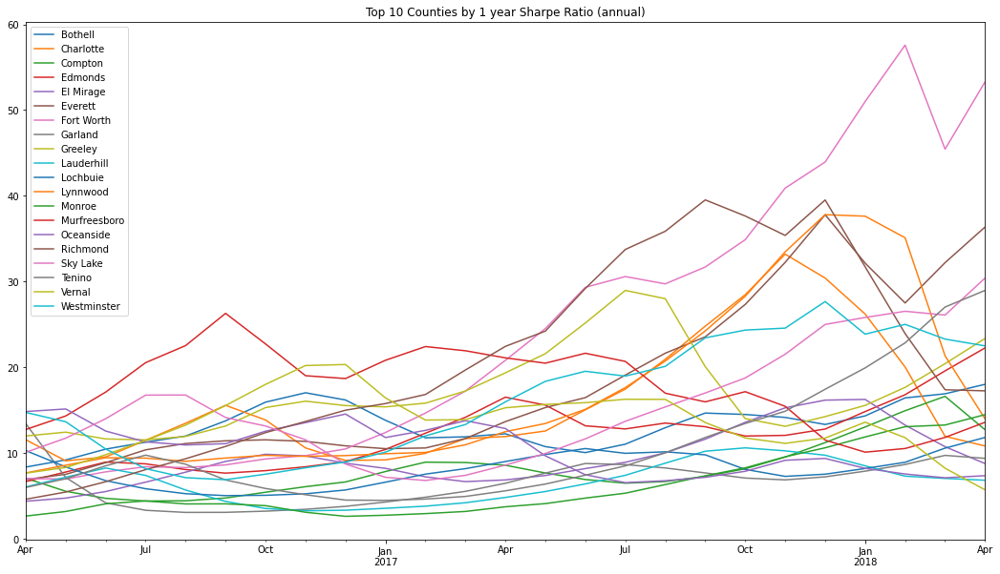

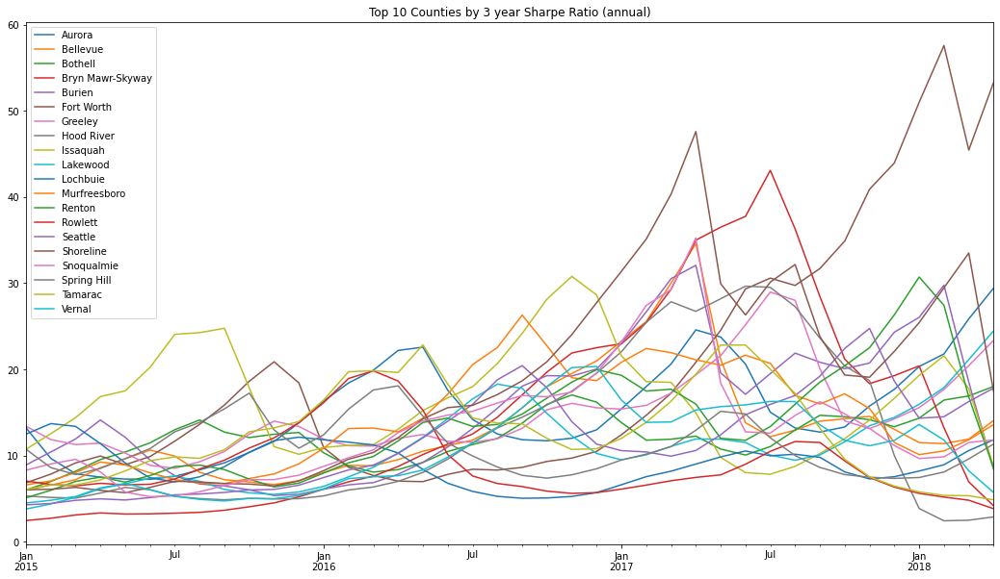

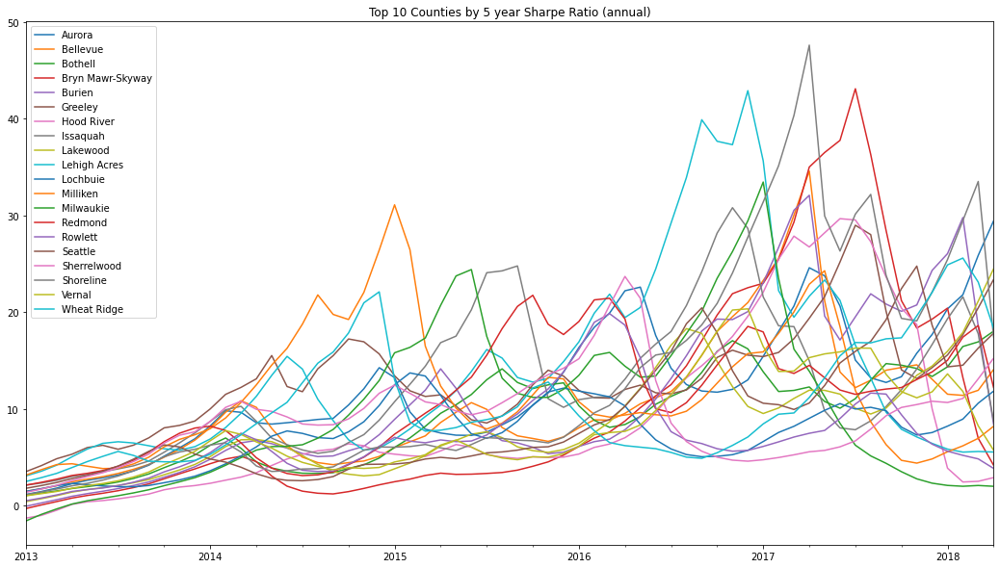

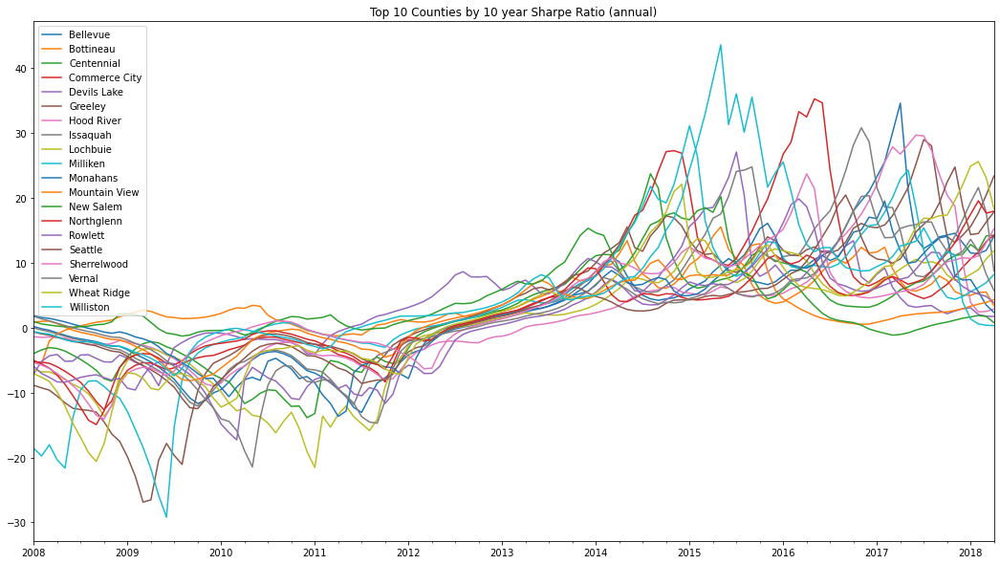

In [170]:
fig1, ax1 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty1:
        if x == city_df.columns[0]:
            city_df['2016-04-01':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax1,)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 1 year Sharpe Ratio (annual)')

fig, ax = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty3:
        if x == city_df.columns[0]:
            city_df['2015':].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 3 year Sharpe Ratio (annual)')



fig2, ax2 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty5:
        if x == city_df.columns[0]:
            city_df['2013':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax2)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 5 year Sharpe Ratio (annual)')

fig3, ax3 = plt.subplots(figsize=(18,10))
for city_df in city_dfs:
    for x in cty10:
        if x == city_df.columns[0]:
            city_df['2008':'2018'].sharpe_ratio_annual.plot(label=city_df.columns[0],ax=ax3)
        else: continue
plt.legend()
plt.title('Top 10 Counties by 10 year Sharpe Ratio (annual)')

In [167]:
df[df.City == 'Sky Lake']

,RegionID,RegionName,City,State,Metro,...,2017-12,2018-01,2018-02,2018-03,2018-04
4734,72235,32809,Sky Lake,FL,Orlando,...,171400,174800,177800,180900,183400


First stop Aurora, Colorado as suspected from Arapahoe county auroroa certianly on the list of cities to invest in

we also like greeley as is treding up in the 5yr and and looks like it isinflecting upward in the 1 yr as well
although also in colorado so may consider elsewhere for diversification purposes

